# Laboratory 6: Frequency Analysis

## Fourier Transform in 1D
### Create your own waveform

In [91]:
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('seaborn-poster')
%matplotlib inline

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\3986292583.py:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-poster')


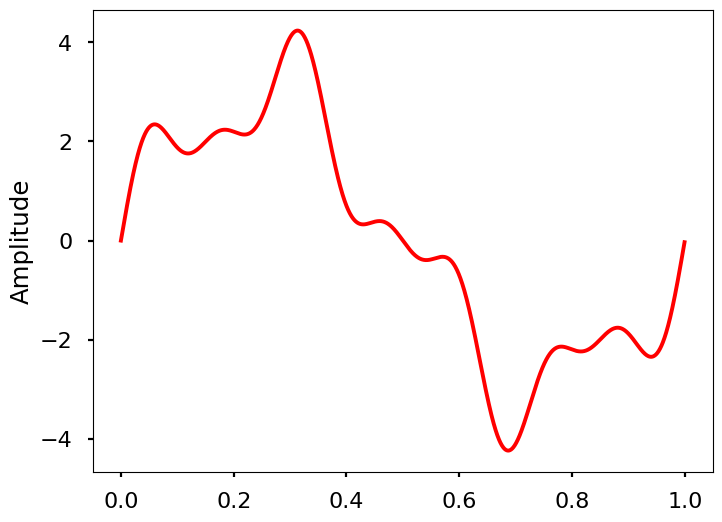

In [92]:
# sampling rate
sr = 2000
# sampling interval
ts = 1.0/sr
t = np.arange(0,1,ts)

freq = 1.
x = 3*np.sin(2*np.pi*freq*t)

freq = 4
x += np.sin(2*np.pi*freq*t)

freq = 7   
x += 0.5* np.sin(2*np.pi*freq*t)

plt.figure(figsize = (8, 6))
plt.plot(t, x, 'r')
plt.ylabel('Amplitude')

plt.show()

C:\Users\chinnawut\anaconda3\envs\ComputerVision\lib\site-packages\matplotlib\cbook\__init__.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


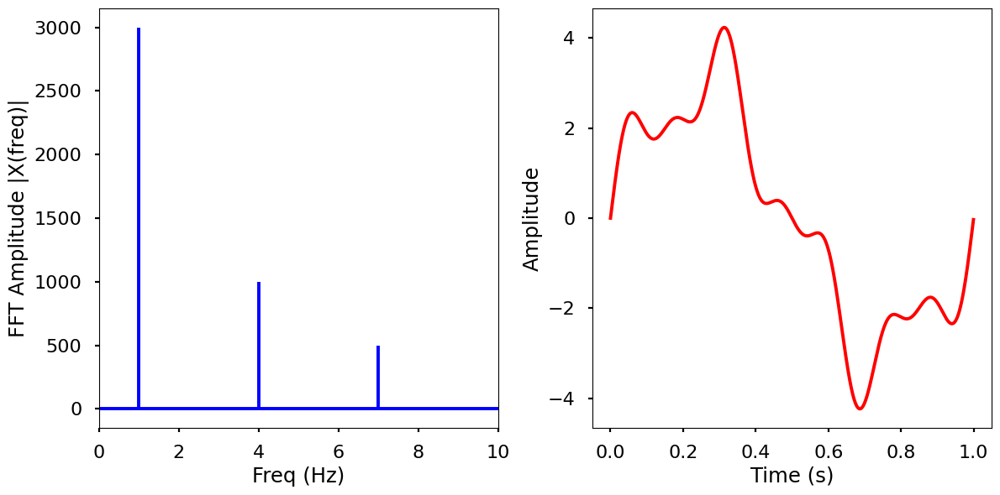

In [93]:
from numpy.fft import fft, ifft

X = fft(x)
N = len(X)
n = np.arange(N)
T = N/sr
freq = n/T 

plt.figure(figsize = (12, 6))
plt.subplot(121)

plt.stem(freq, np.abs(X), 'b', \
         markerfmt=" ", basefmt="-b")
plt.xlabel('Freq (Hz)')
plt.ylabel('FFT Amplitude |X(freq)|')
plt.xlim(0, 10)

plt.subplot(122)
plt.plot(t, ifft(X), 'r')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()

# 2D Fourier Transform

## 2D Fourier Transform of simple 2D signals

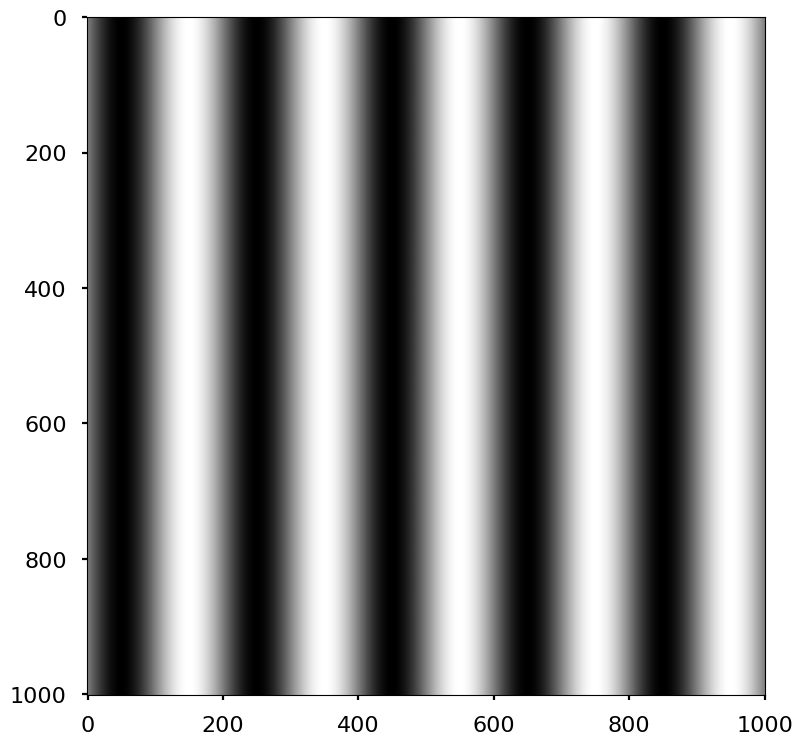

In [94]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)
wavelength = 200
angle = 0
grating = np.sin(
    2*np.pi*(X*np.cos(angle) + Y*np.sin(angle)) / wavelength
)

plt.set_cmap("gray")
plt.imshow(grating)
plt.show()


In [95]:
# ## This take a lot of time to run. You can try it later.

# from matplotlib.colors import LightSource
# from matplotlib import cbook, cm

# # Set up plot
# fig, ax = plt.subplots(subplot_kw=dict(projection='3d'))

# ls = LightSource(270, 45)
# # To use a custom hillshading mode, override the built-in shading and pass
# # in the rgb colors of the shaded surface calculated from "shade".
# rgb = ls.shade(grating, cmap=cm.gist_earth, vert_exag=0.1, blend_mode='soft')
# surf = ax.plot_surface(X, Y, grating, rstride=1, cstride=1, facecolors=rgb,
#                        linewidth=0, antialiased=False, shade=False)

# plt.show()

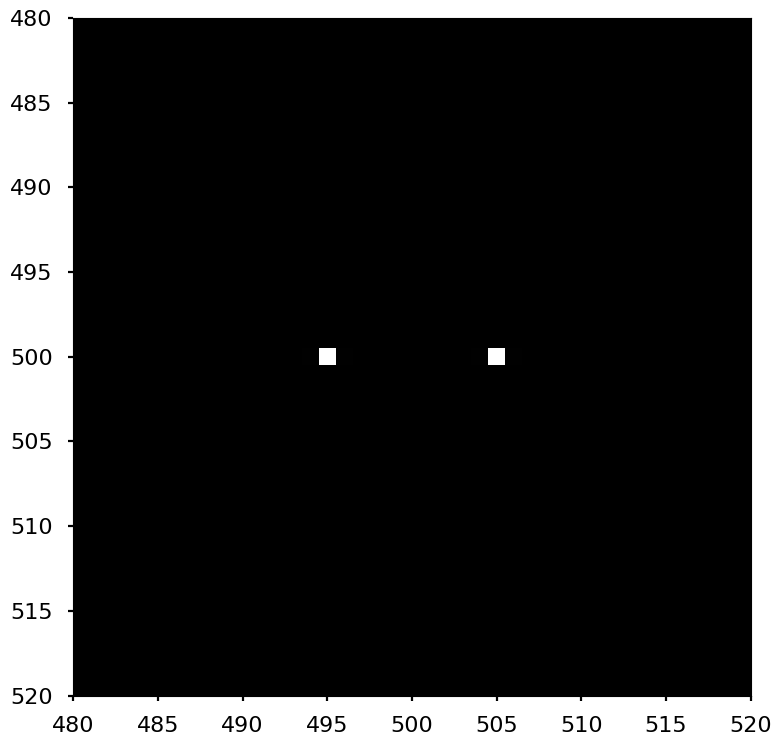

In [96]:
# Calculate Fourier transform of grating
ft = np.fft.ifftshift(grating)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)
plt.imshow(abs(ft))
plt.xlim([480, 520])
plt.ylim([520, 480])
plt.show()

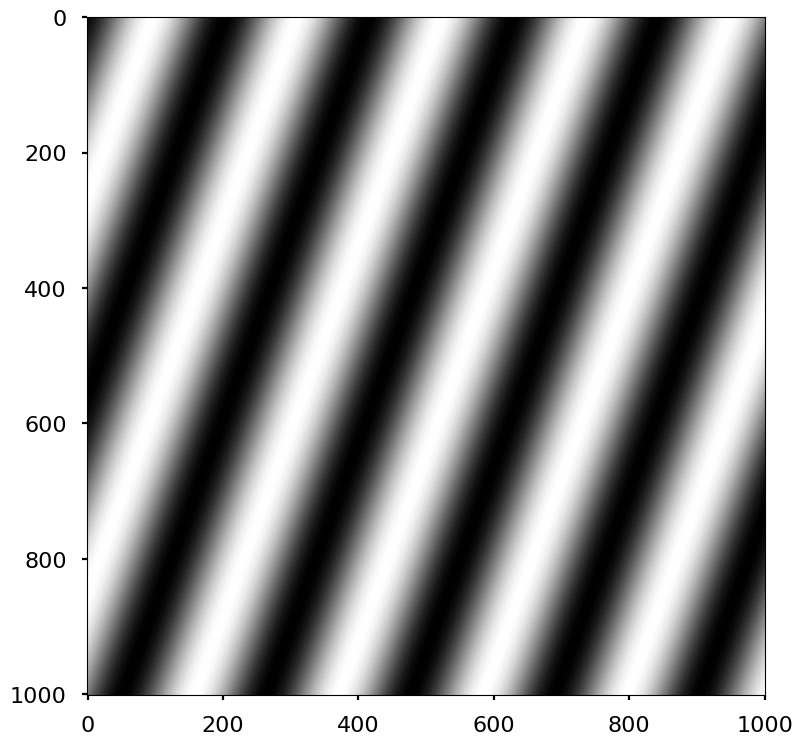

In [97]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)
wavelength = 200
angle = np.pi / 9
grating = np.sin(
    2*np.pi*(X*np.cos(angle) + Y*np.sin(angle)) / wavelength
)

plt.set_cmap("gray")
plt.imshow(grating)
plt.show()

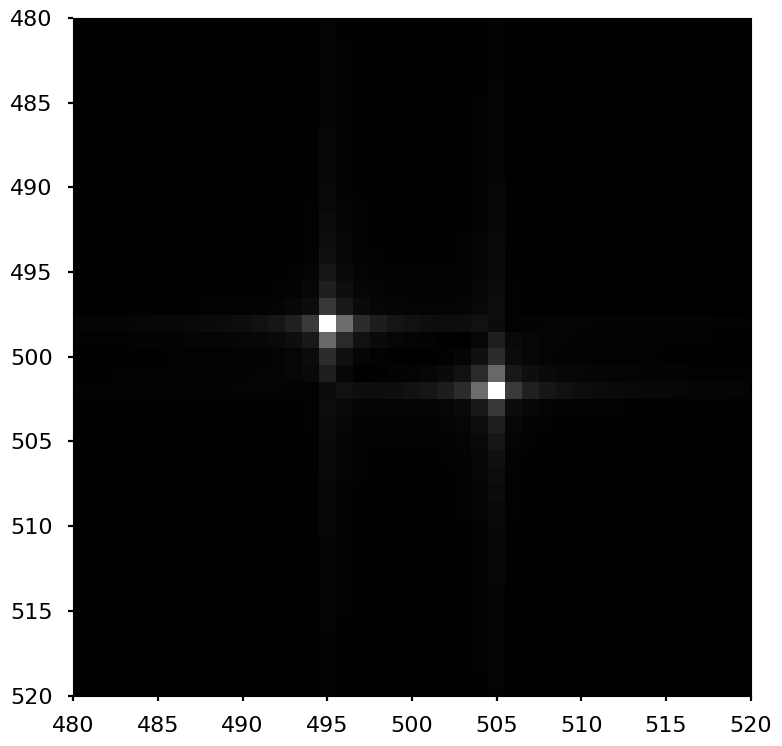

In [98]:
# Calculate Fourier transform of grating
ft = np.fft.ifftshift(grating)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)
plt.imshow(abs(ft))
plt.xlim([480, 520])
plt.ylim([520, 480])
plt.show()

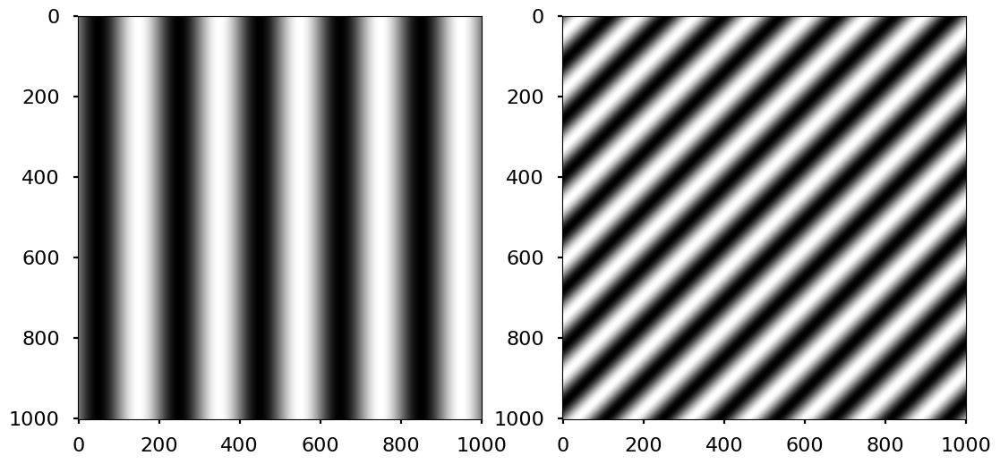

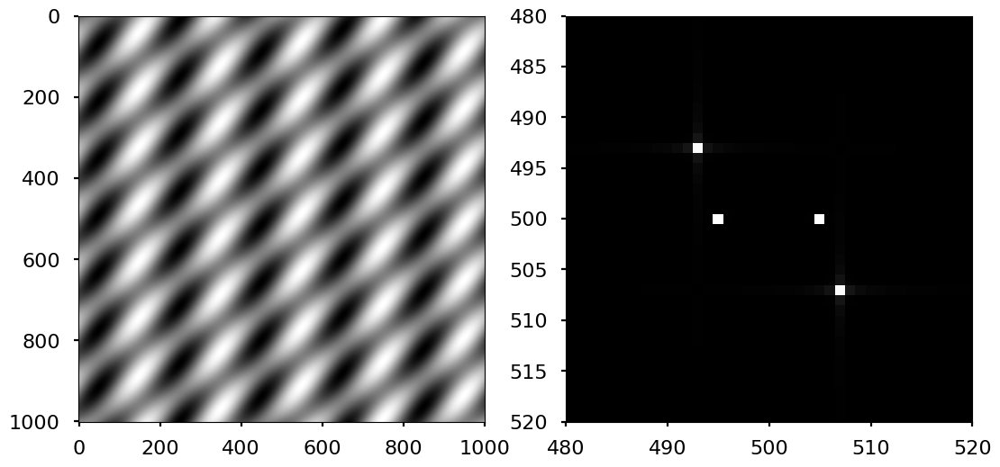

In [99]:
import numpy as np
import matplotlib.pyplot as plt
x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)
wavelength_1 = 200
angle_1 = 0
grating_1 = np.sin(
    2*np.pi*(X*np.cos(angle_1) + Y*np.sin(angle_1)) / wavelength_1
)
wavelength_2 = 100
angle_2 = np.pi/4
grating_2 = np.sin(
    2*np.pi*(X*np.cos(angle_2) + Y*np.sin(angle_2)) / wavelength_2
)
plt.set_cmap("gray")
plt.subplot(121)
plt.imshow(grating_1)
plt.subplot(122)
plt.imshow(grating_2)
plt.show()
gratings = grating_1 + grating_2

# Calculate Fourier transform of the sum of the two gratings
ft = np.fft.ifftshift(gratings)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)
plt.figure()
plt.subplot(121)
plt.imshow(gratings)
plt.subplot(122)
plt.imshow(abs(ft))
plt.xlim([480, 520])
plt.ylim([520, 480])  # Note, order is reversed for y
plt.show()

## 2D Fourier Transform of an image

In [193]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('Images/lenna.png')
assert img is not None, "file could not be read, check with os.path.exists()"

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [243]:
f = np.fft.fft2(img_gray, axes=(0,1))
fshift = np.fft.fftshift(f)

# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum = 20*np.log(np.abs(fshift))

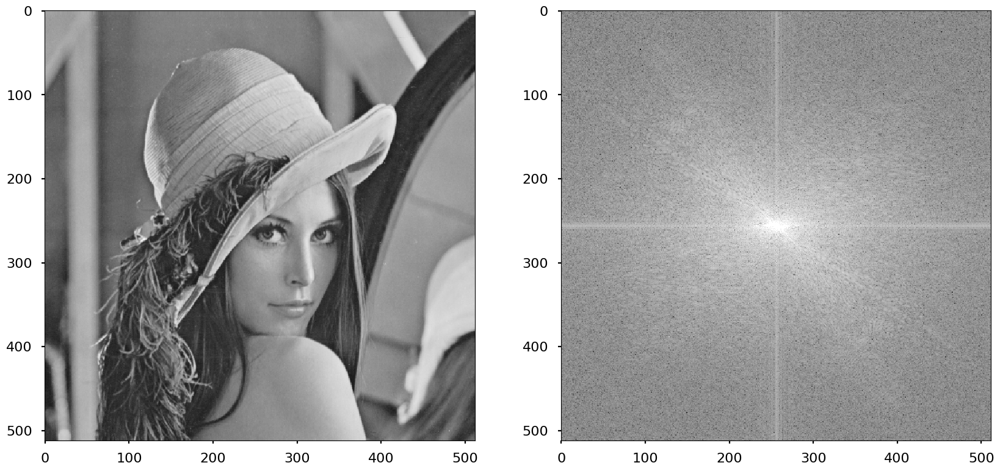

In [102]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(magnitude_spectrum, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

## Manipulating frequencies: Filtering in frequency domain

### Simple cirle mask

In [103]:
# create circle mask
radius = 32
mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

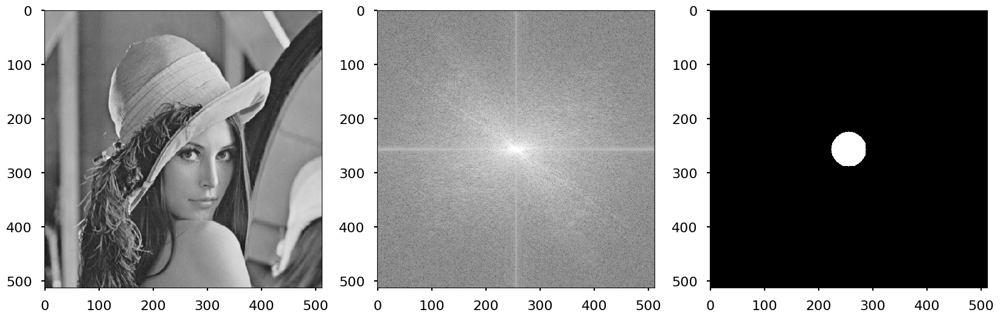

In [104]:
# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(magnitude_spectrum, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(mask, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

In [105]:
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\14692760.py:2: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))


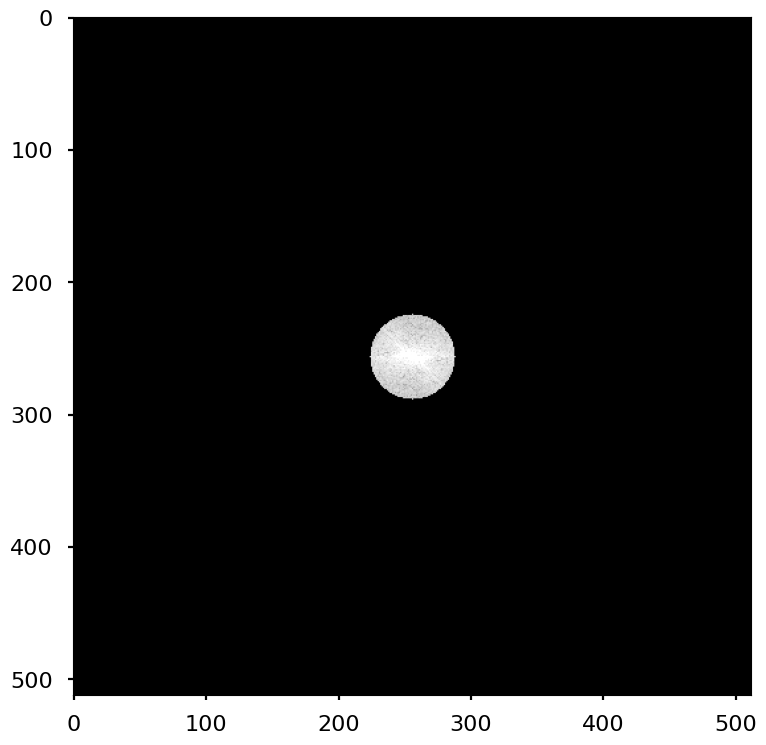

In [106]:
# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

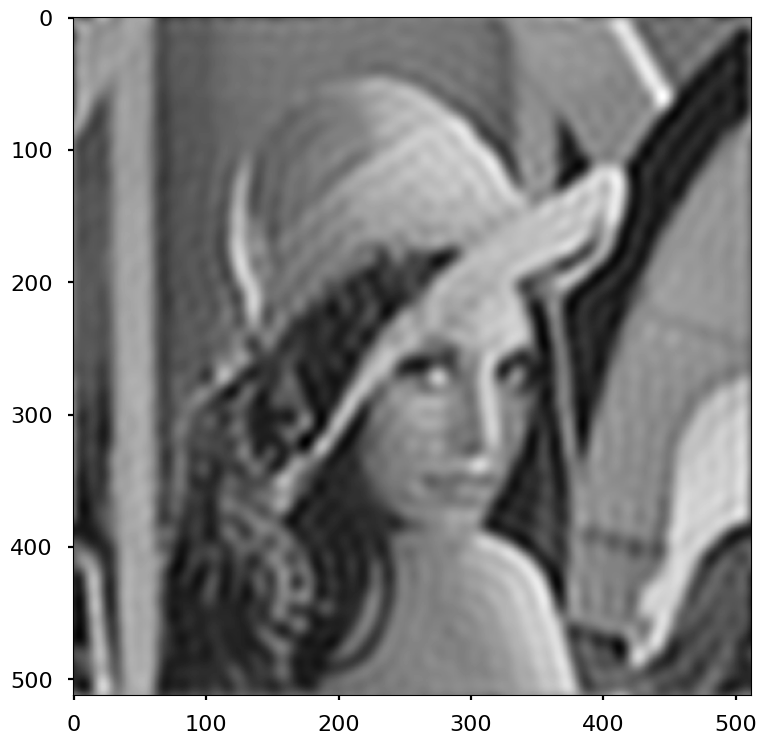

In [107]:
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

### Gaussian mask

In [108]:
# blur the mask
mask2 = cv2.GaussianBlur(mask, (19,19), 0)

In [244]:
# apply mask to fshift
dft_shift_masked2 = np.multiply(fshift,mask2) / 255

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\1333631435.py:2: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked2 = 20*np.log(np.abs(dft_shift_masked2))


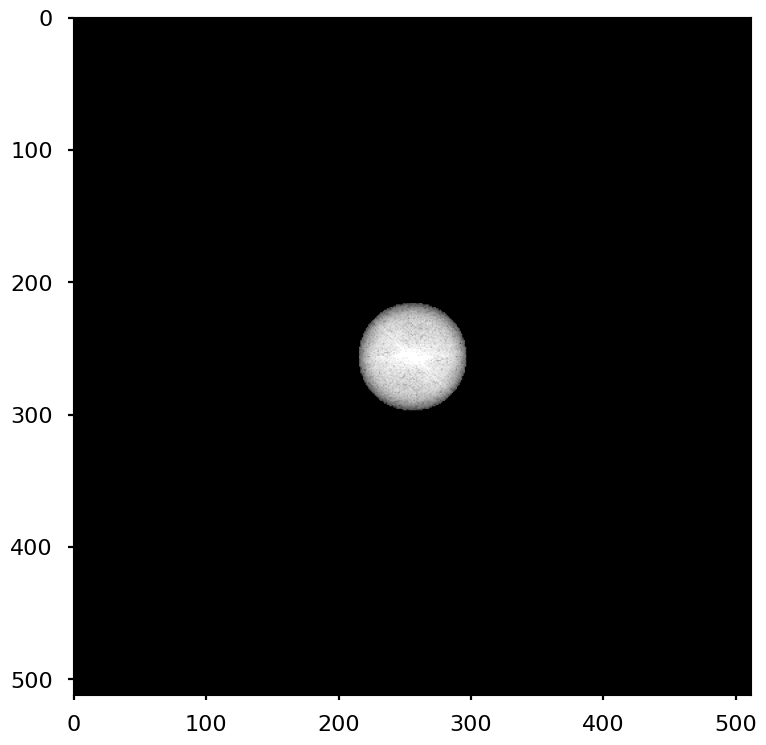

In [110]:
# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked2 = 20*np.log(np.abs(dft_shift_masked2))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked2.clip(0,255))
plt.show()

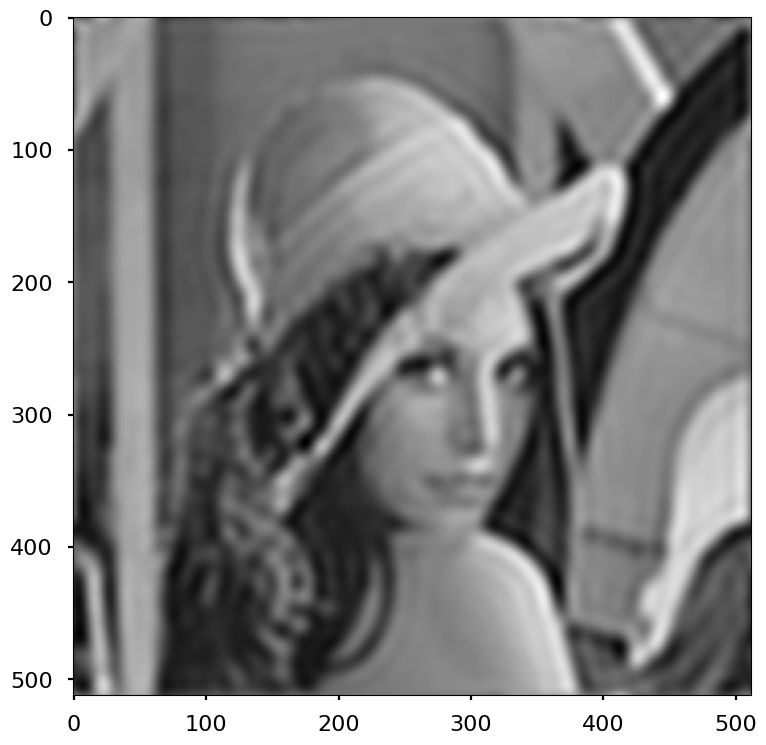

In [111]:
back_ishift_masked2 = np.fft.ifftshift(dft_shift_masked2)

img_filtered2 = np.fft.ifft2(back_ishift_masked2, axes=(0,1))
img_filtered2 = np.abs(img_filtered2).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered2)
plt.show()

# Assignment 1: Perform High Pass filter

In [112]:
# Assignment 1: Perform High pass filter, Band pass filter, and Band elimination filter in frequency domain:
# Hint1: Create a new mask that can remove the target frequency. 
# Hint2: High pass filter is the inverse of low pass filter

### High pass filter (HPF)

In [249]:
# create circle mask
radius = 32
mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]
bitwise = cv2.bitwise_not(mask, mask)

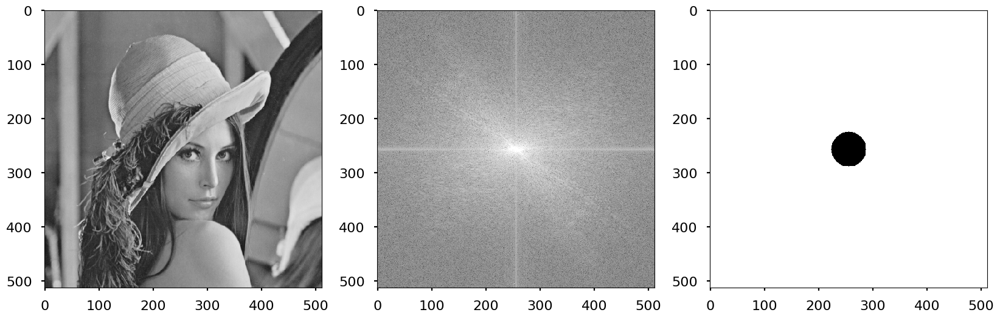

In [250]:
# display the images
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
ax1.imshow(img_gray, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax2.imshow(magnitude_spectrum, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
ax3.imshow(mask, cmap='gray', vmin = 0, vmax = 255,interpolation='none')
plt.show()

In [251]:
f = np.fft.fft2(img_gray, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\14692760.py:2: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))


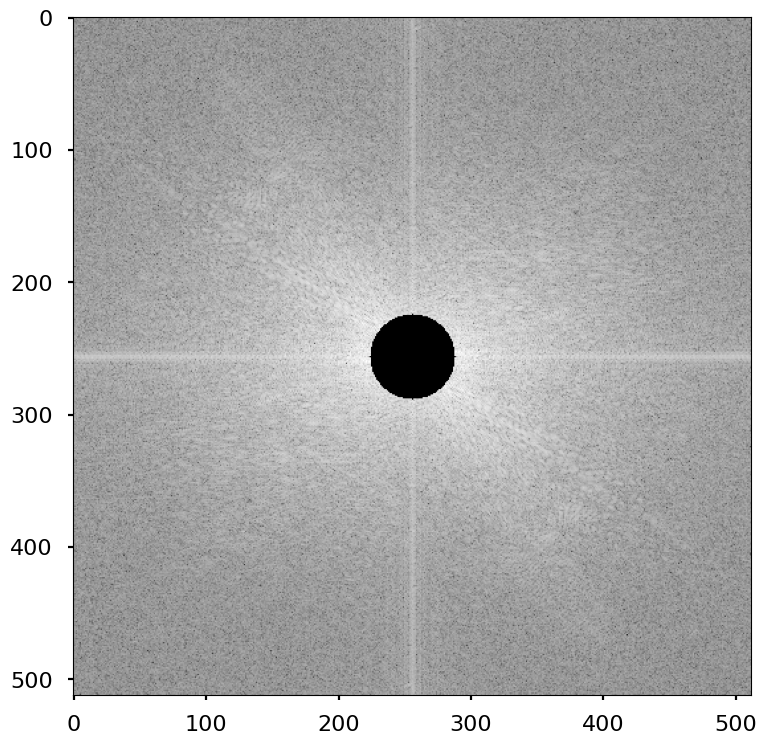

In [252]:
# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

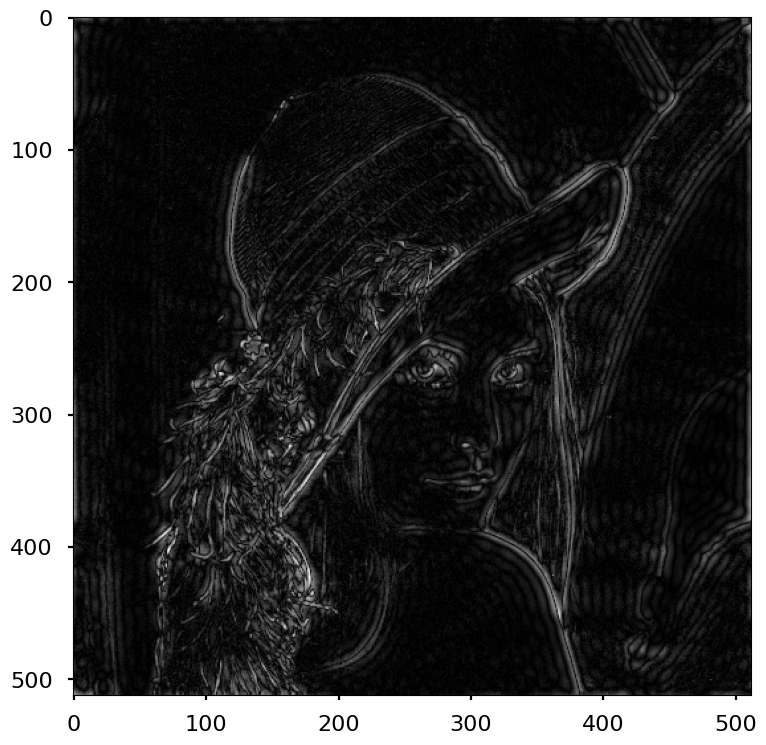

In [253]:
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

### Band pass filter (BPF)

In [254]:
# create circle mask
radius = 32
mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]


radius2 = 10
#mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx, cy), radius2, (0, 0, 0), -1)[0]



array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [255]:
f = np.fft.fft2(img_gray, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\14692760.py:2: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))


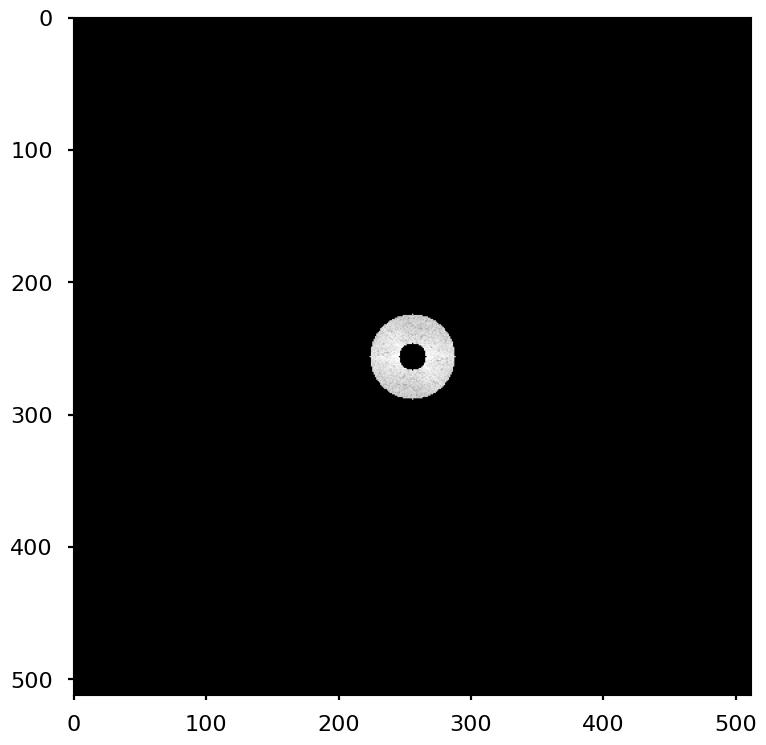

In [256]:
# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

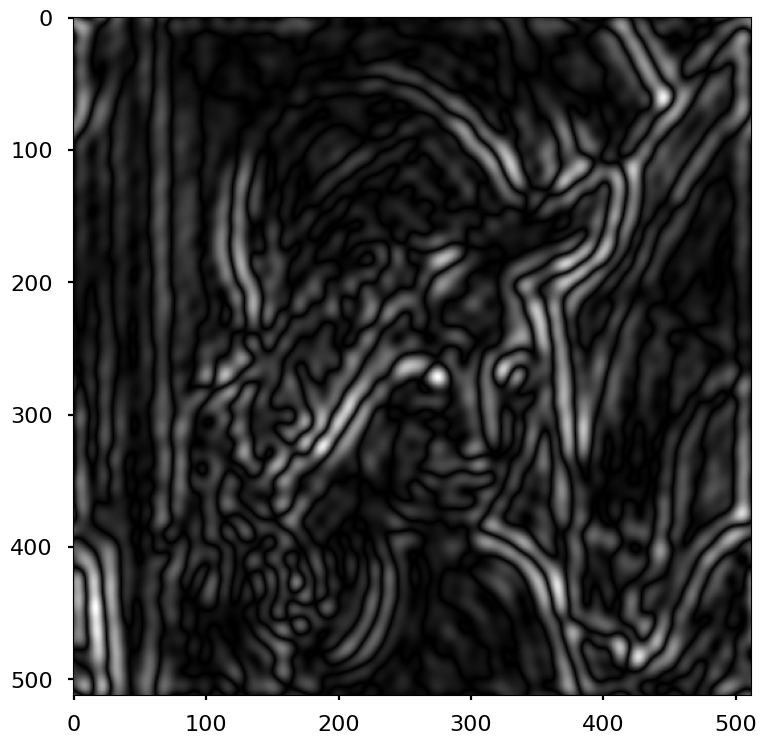

In [257]:
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

### Band elimination filter (BEF)

In [258]:
# create circle mask
radius = 32
mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]


radius2 = 10
#mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx, cy), radius2, (0, 0, 0), -1)[0]
bitwise = cv2.bitwise_not(mask, mask)


In [259]:
f = np.fft.fft2(img_gray, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\14692760.py:2: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))


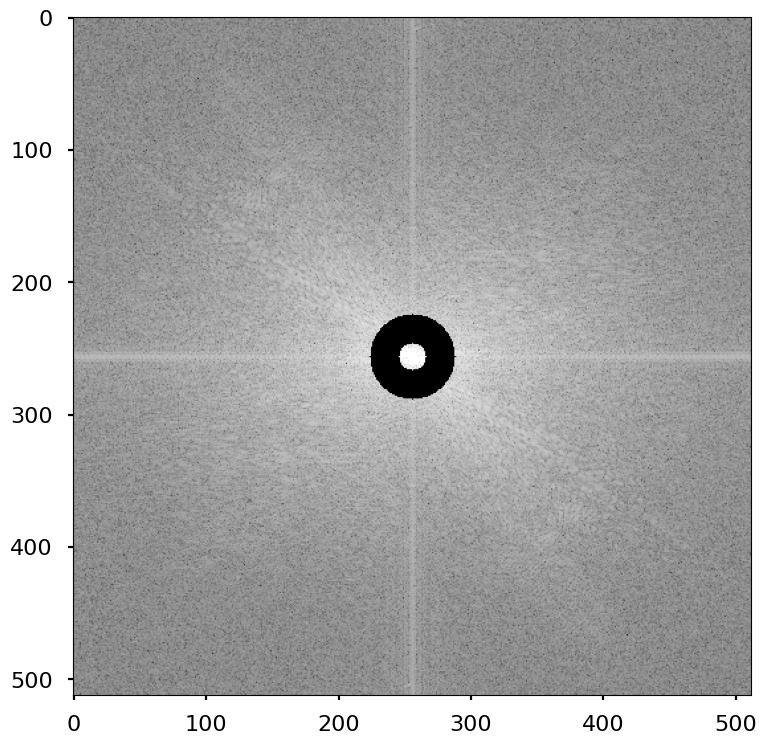

In [260]:
# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

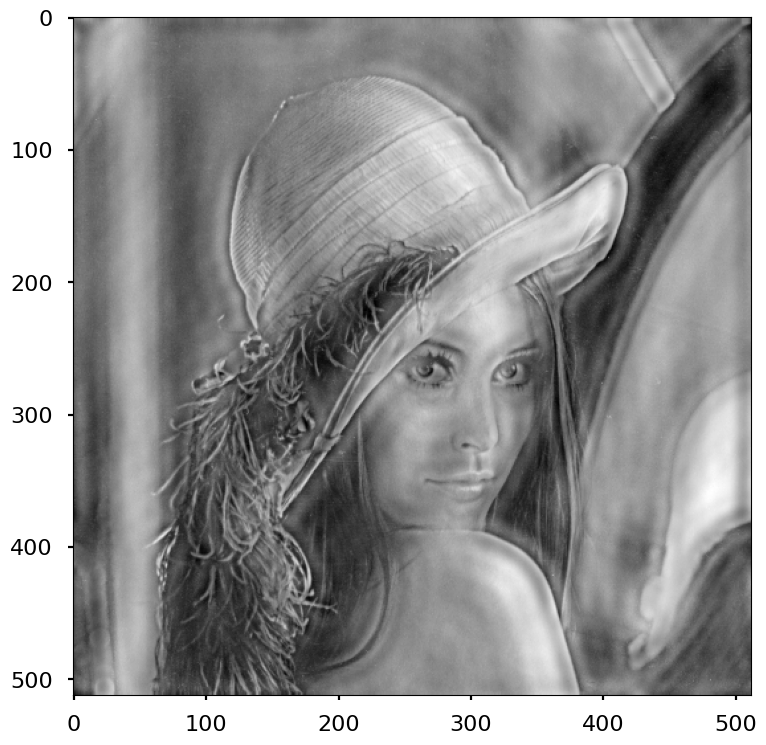

In [261]:
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

# Assignment 2: Try this tutorial with color images (Perform LPF, HPF, BPF, BEF). 

In [294]:
# Assignment 2: Try this tutorial with color images (Perform LPF, HPF, BPF, BEF). 
# Try at least 3 images to compare the characteristics of frequencies
# Also, test these filtering methods in different frequency range too.

In [295]:
capybara = cv2.imread('Images/capybara.png')
nemo0 = cv2.imread('Images/nemo0.jpg')
ironman = cv2.imread("Images/ironman.jpg")

assert img is not None, "file could not be read, check with os.path.exists()"

img1 = cv2.cvtColor(capybara, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(nemo0, cv2.COLOR_BGR2RGB)
img3 = cv2.cvtColor(ironman, cv2.COLOR_BGR2RGB)

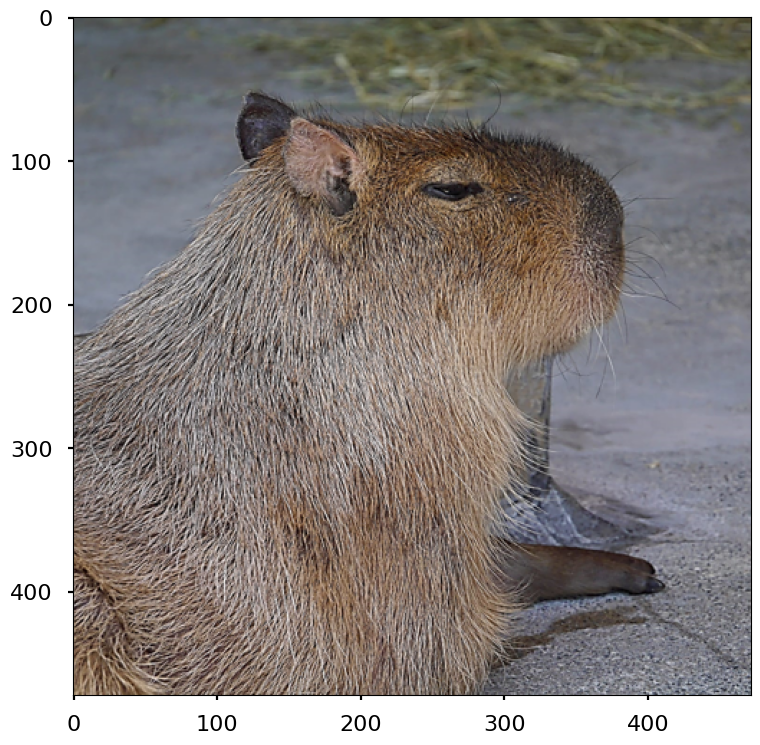

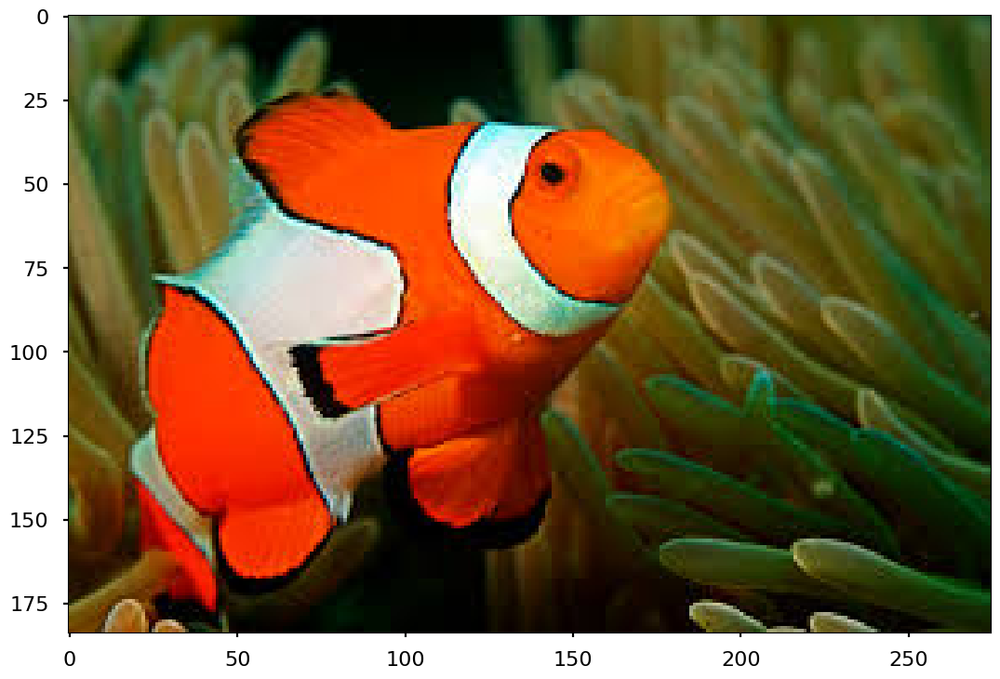

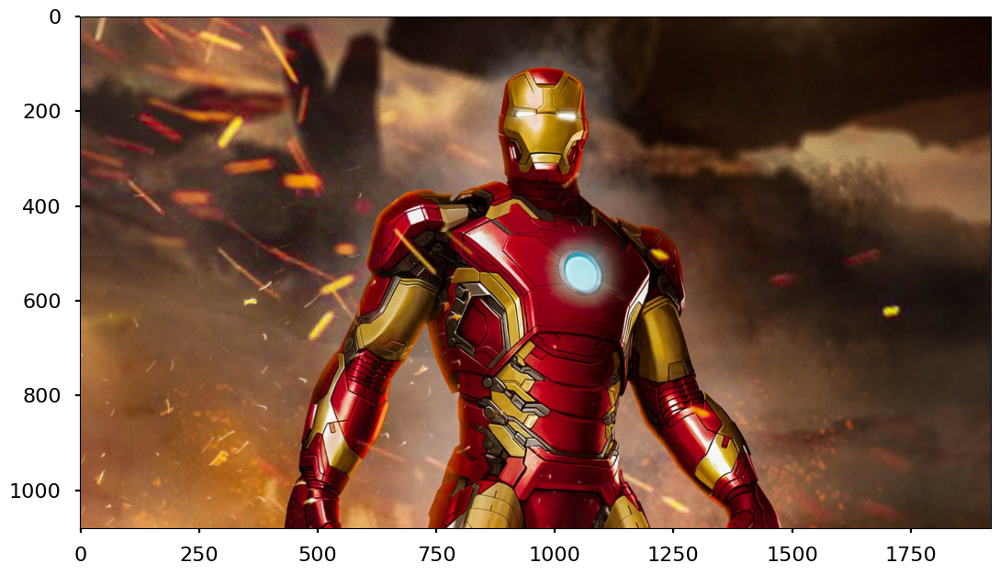

In [296]:
plt.imshow(img1)
plt.show()
plt.imshow(img2)
plt.show()
plt.imshow(img3)
plt.show()

### LPF

In [298]:
# create circle mask
radius = 32
mask = np.zeros_like(img1)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]

array([[0, 0, 0],
       [0, 0, 0],
       [0, 0, 0],
       ...,
       [0, 0, 0],
       [0, 0, 0],
       [0, 0, 0]], dtype=uint8)

In [299]:
f = np.fft.fft2(img1, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\14692760.py:2: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


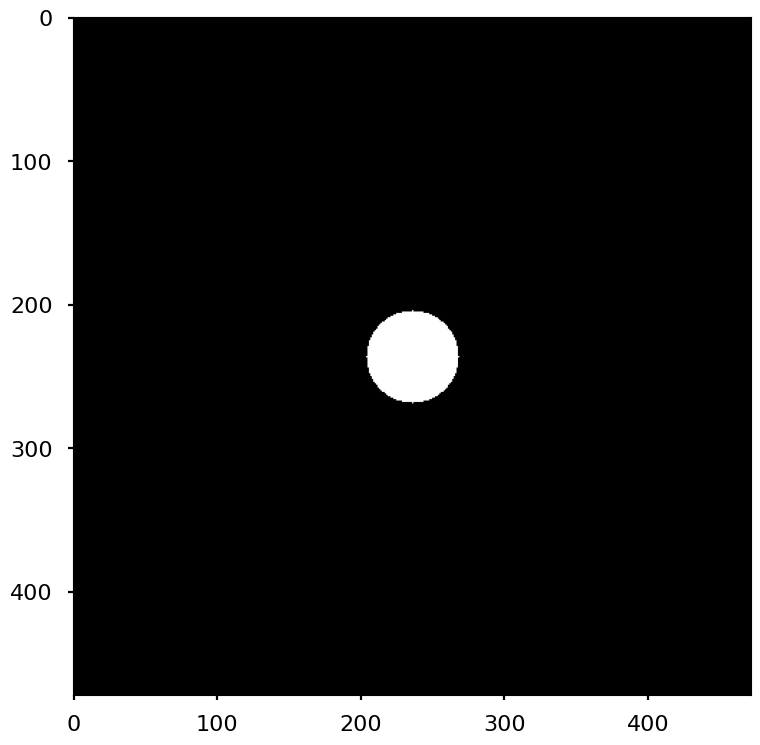

In [300]:
# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

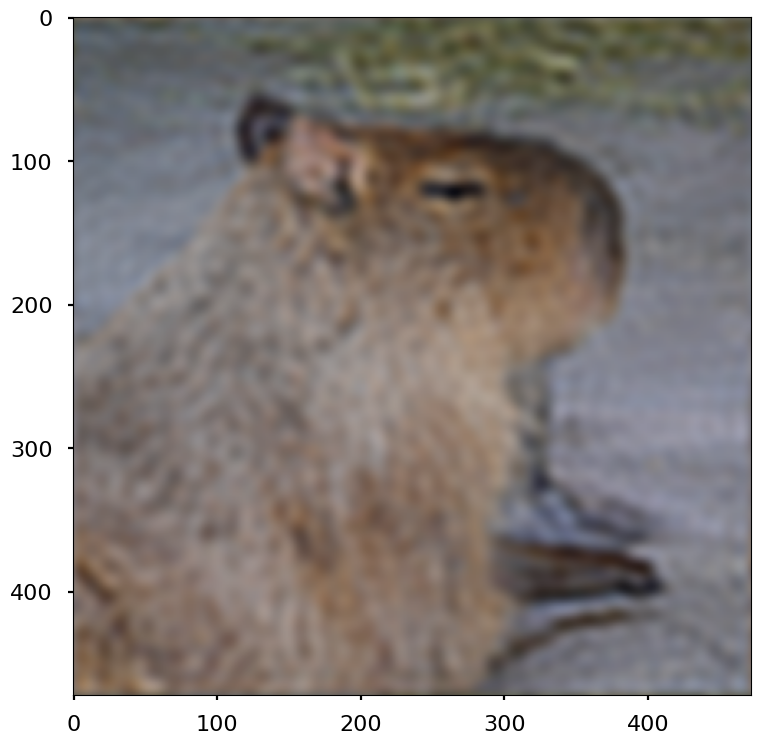

In [301]:
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\2006384751.py:15: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


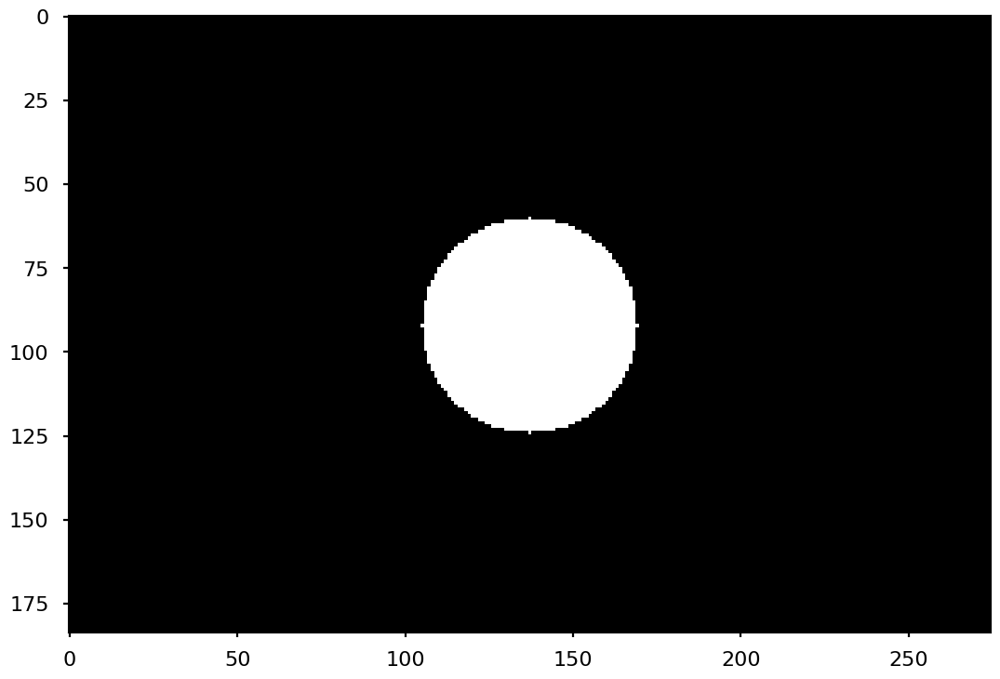

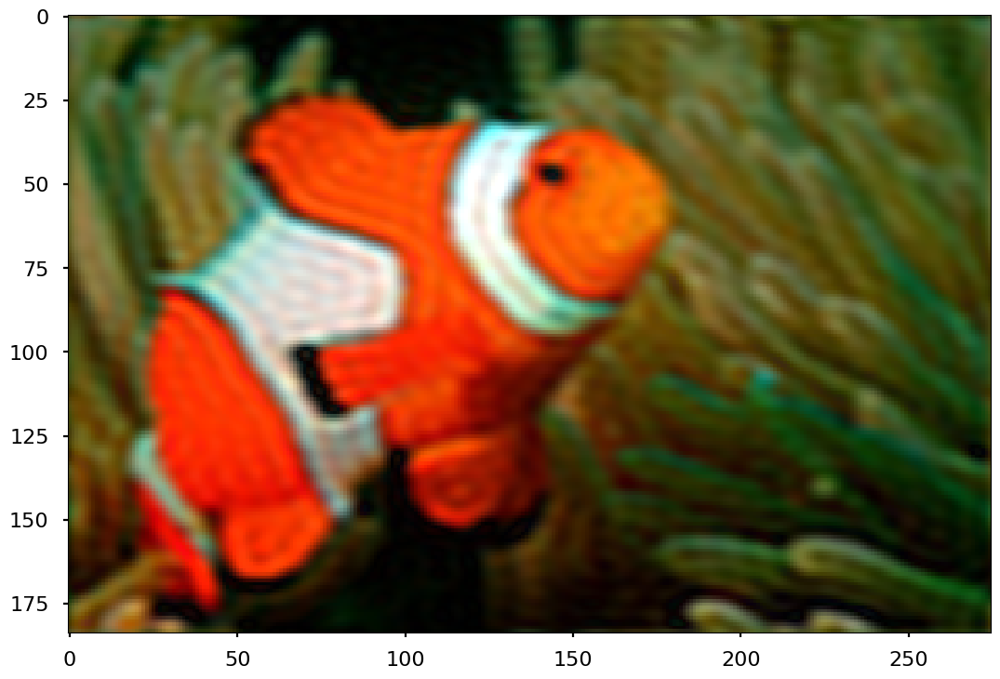

In [318]:
# create circle mask
radius = 32
mask = np.zeros_like(img2)

cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]

f = np.fft.fft2(img2, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\2250294329.py:15: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


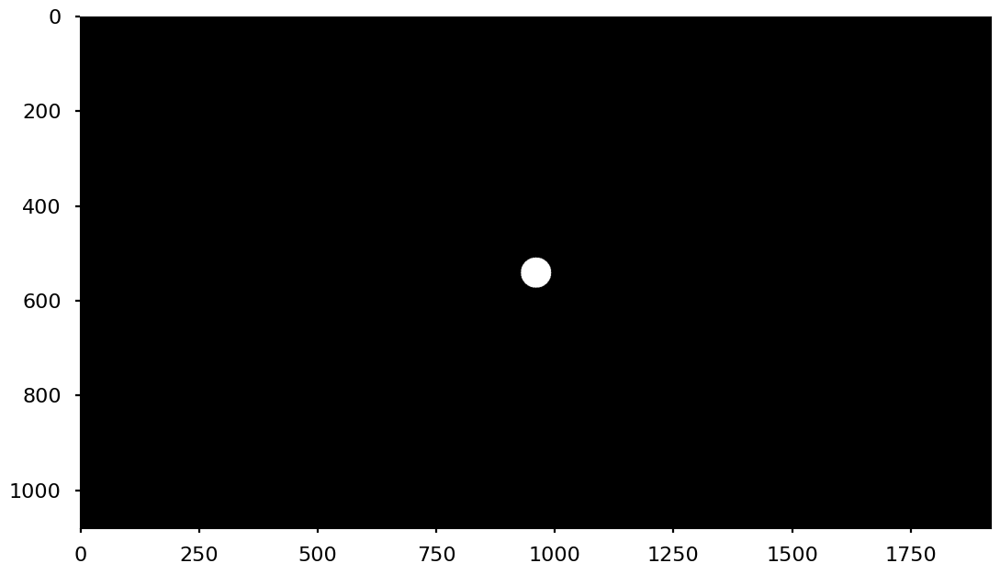

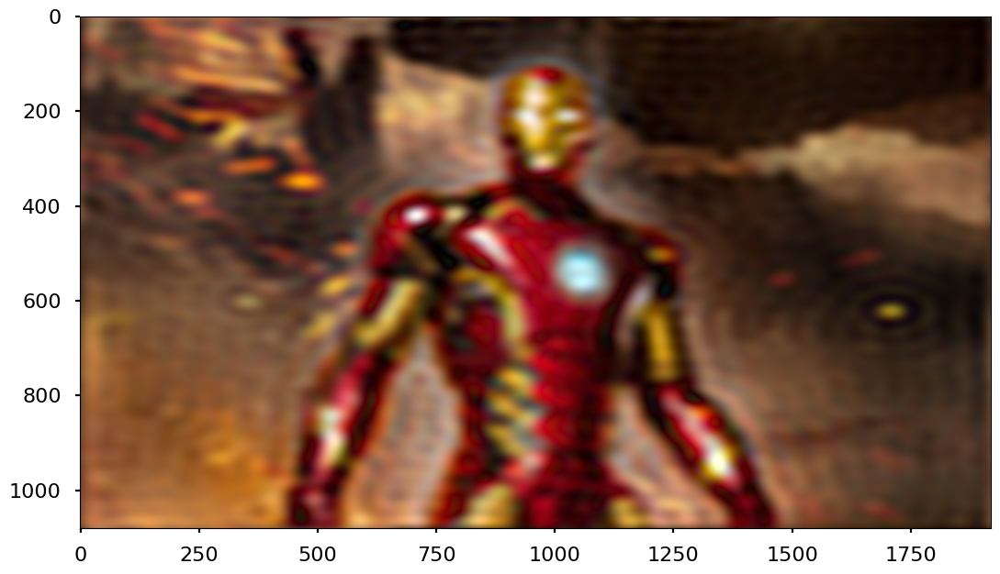

In [317]:
# create circle mask
radius = 32
mask = np.zeros_like(img3)

cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]

f = np.fft.fft2(img3, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

### HPF

In [319]:
# create circle mask
radius = 32
mask = np.zeros_like(img1)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]
bitwise = cv2.bitwise_not(mask, mask)

In [321]:
f = np.fft.fft2(img1, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\14692760.py:2: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


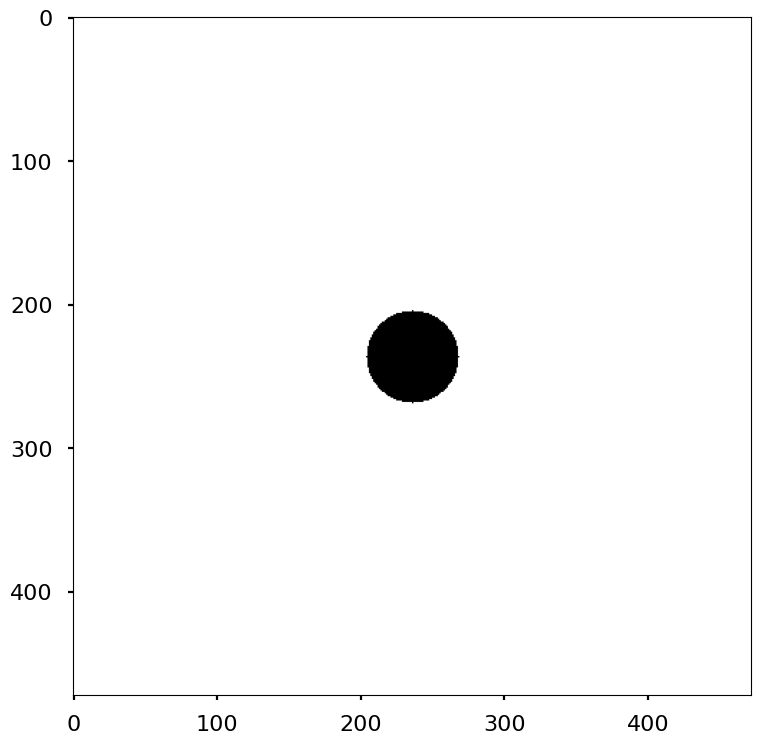

In [322]:
# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

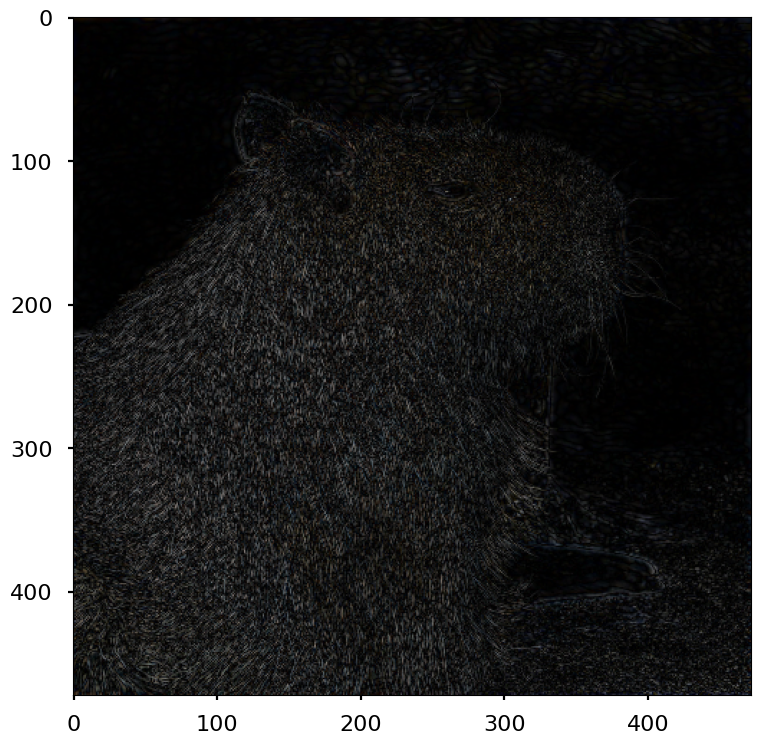

In [323]:
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\1170675236.py:15: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


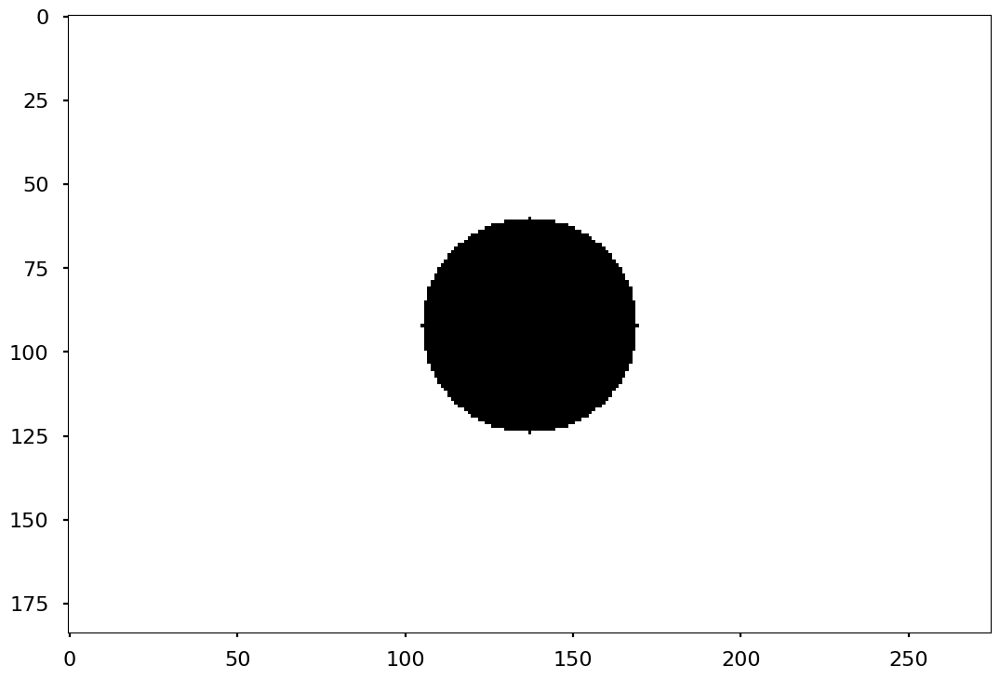

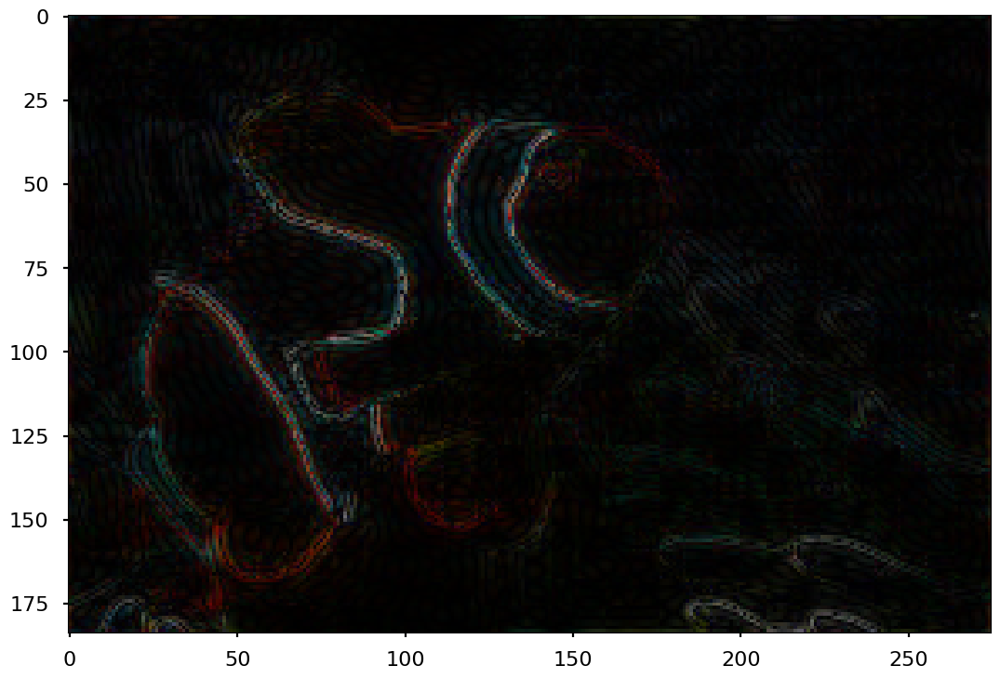

In [325]:
# create circle mask
radius = 32
mask = np.zeros_like(img2)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]
bitwise = cv2.bitwise_not(mask, mask)

f = np.fft.fft2(img2, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\292049914.py:15: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


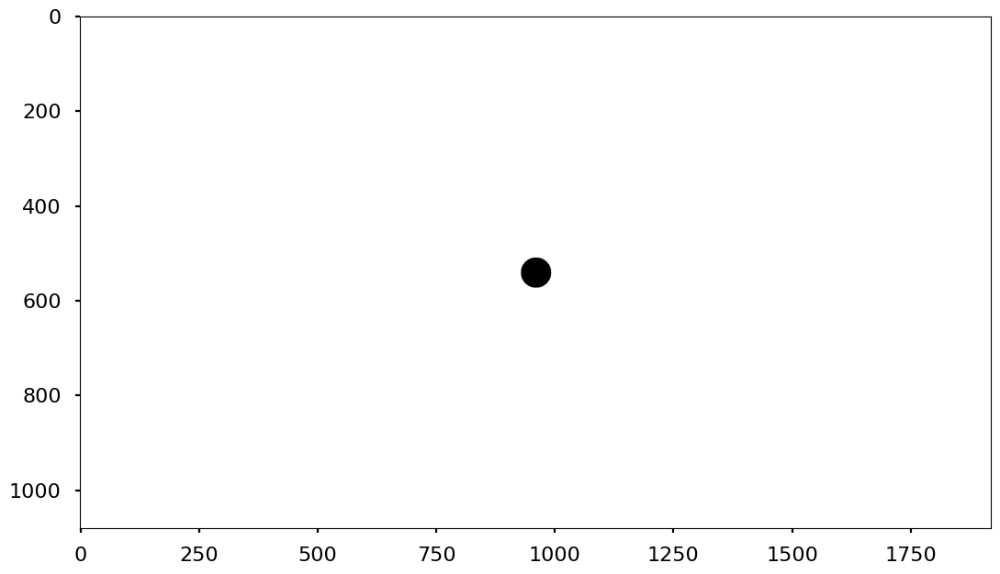

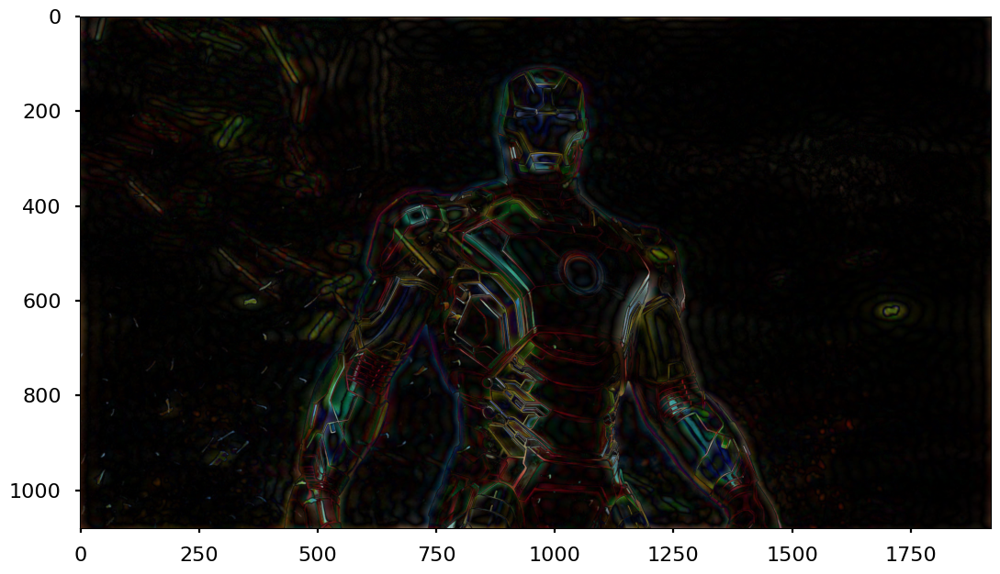

In [326]:
# create circle mask
radius = 32
mask = np.zeros_like(img3)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]
bitwise = cv2.bitwise_not(mask, mask)

f = np.fft.fft2(img3, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

### BPF

In [327]:
# create circle mask
radius = 32
mask = np.zeros_like(img1)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]


radius2 = 10
#mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx, cy), radius2, (0, 0, 0), -1)[0]



array([[0, 0, 0],
       [0, 0, 0],
       [0, 0, 0],
       ...,
       [0, 0, 0],
       [0, 0, 0],
       [0, 0, 0]], dtype=uint8)

In [328]:
f = np.fft.fft2(img1, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\14692760.py:2: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


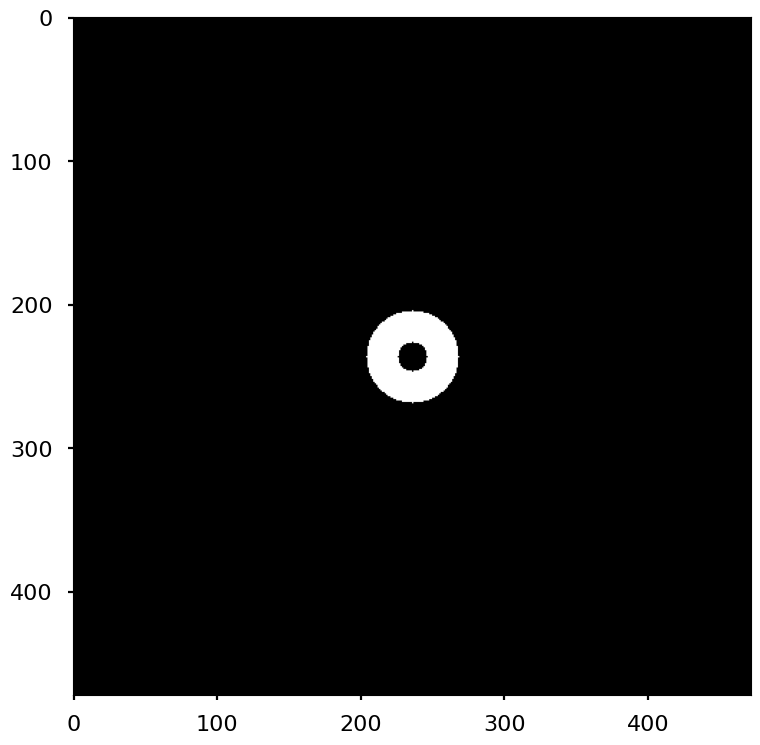

In [329]:
# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

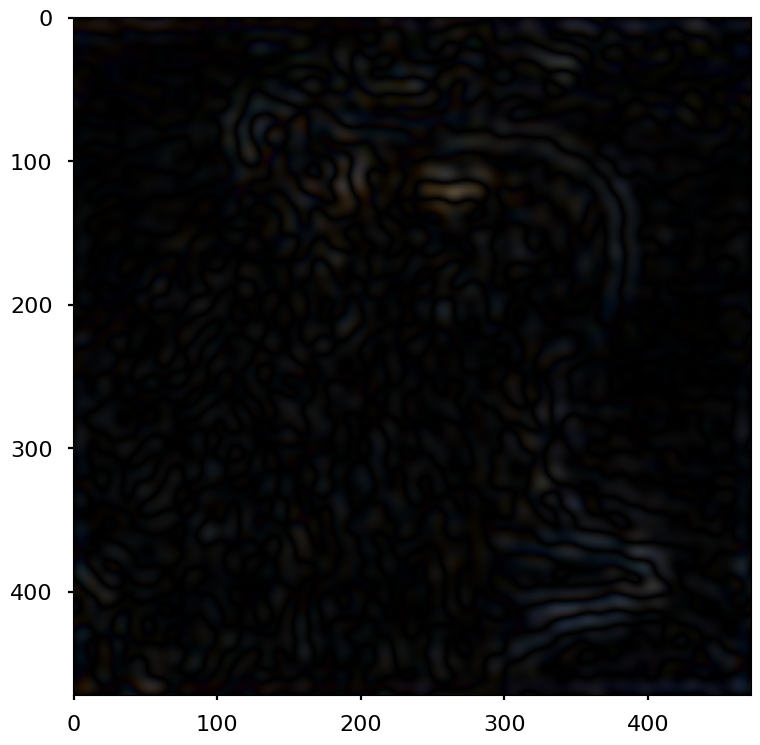

In [330]:
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\3234134205.py:21: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


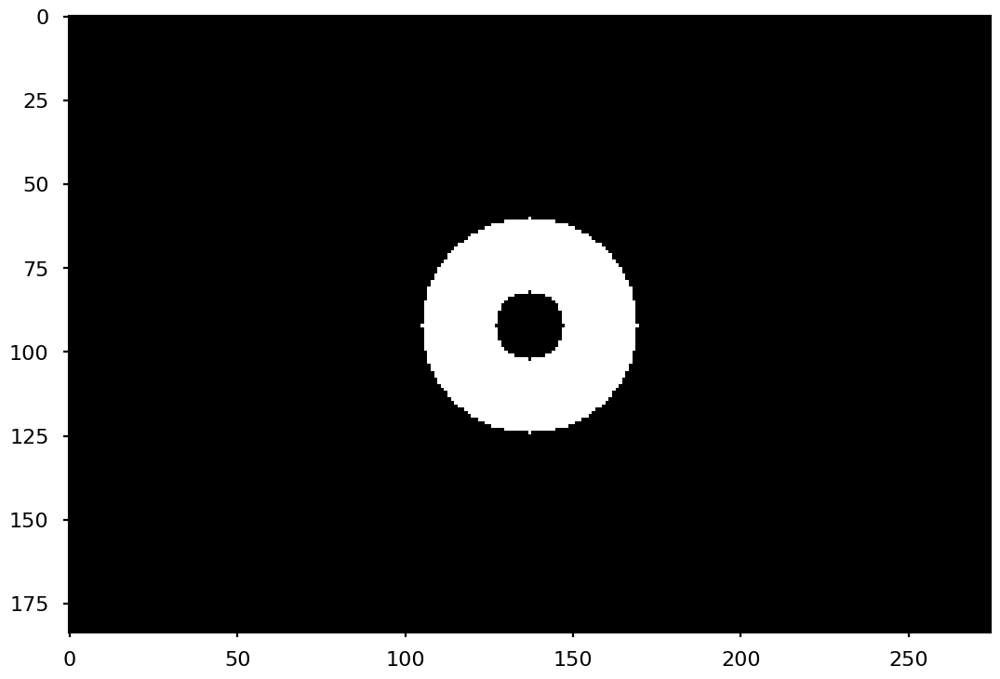

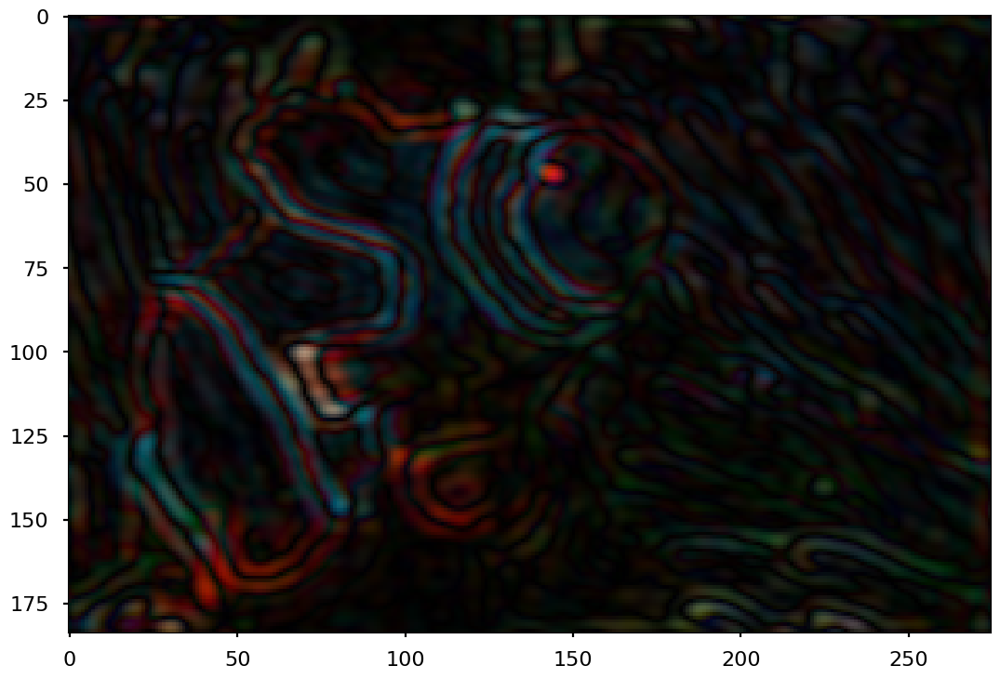

In [331]:
# create circle mask
radius = 32
mask = np.zeros_like(img2)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]


radius2 = 10
#mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx, cy), radius2, (0, 0, 0), -1)[0]

f = np.fft.fft2(img2, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\1870991034.py:21: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


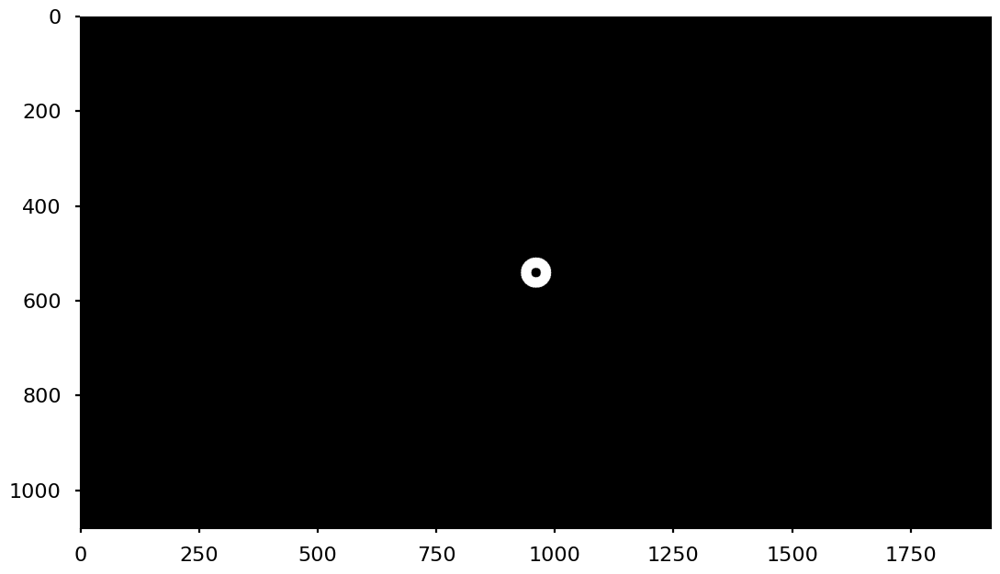

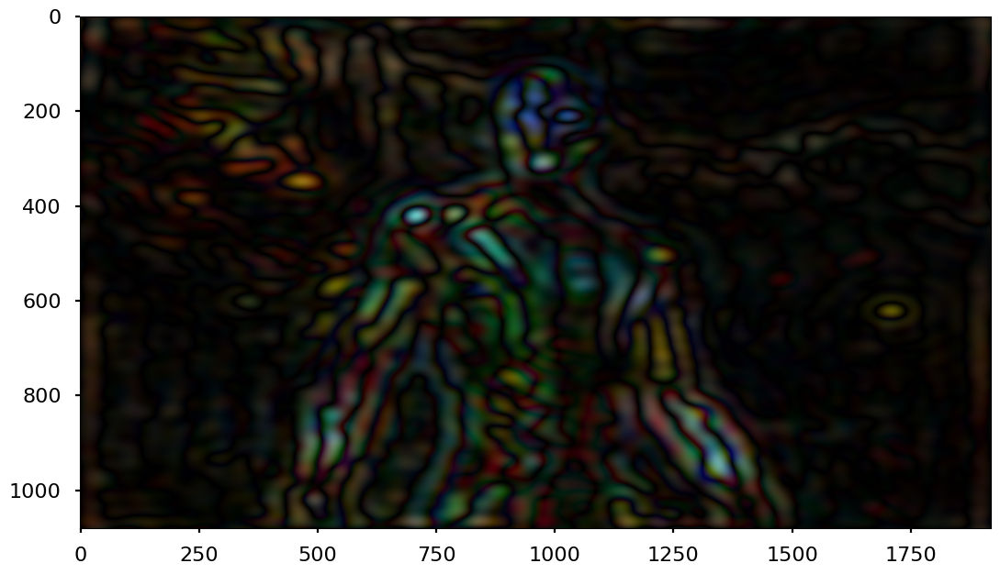

In [332]:
# create circle mask
radius = 32
mask = np.zeros_like(img3)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]


radius2 = 10
#mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx, cy), radius2, (0, 0, 0), -1)[0]

f = np.fft.fft2(img3, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

### BEF

In [333]:
# create circle mask
radius = 32
mask = np.zeros_like(img1)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]


radius2 = 10
#mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx, cy), radius2, (0, 0, 0), -1)[0]
bitwise = cv2.bitwise_not(mask, mask)


In [334]:
f = np.fft.fft2(img1, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\14692760.py:2: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


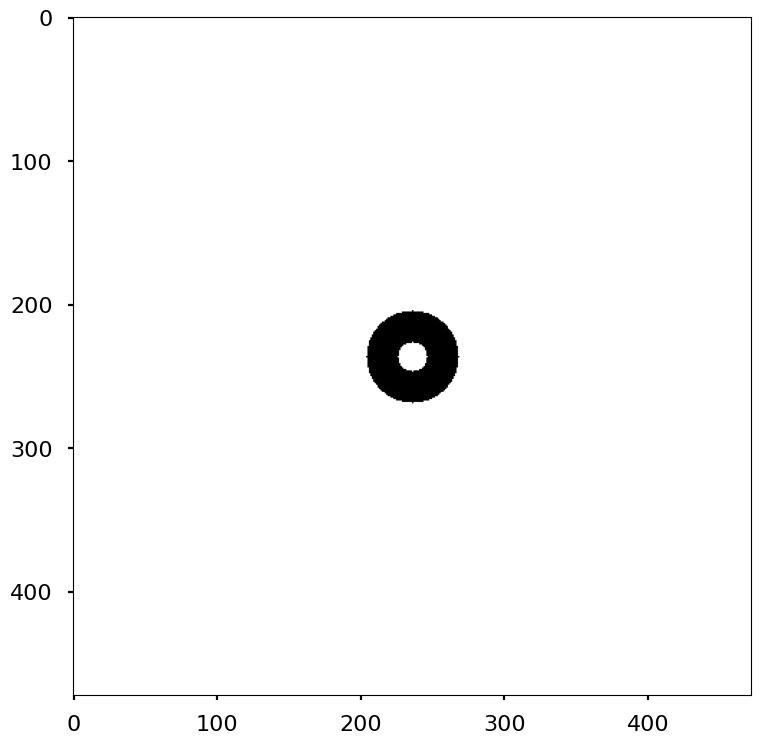

In [335]:
# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

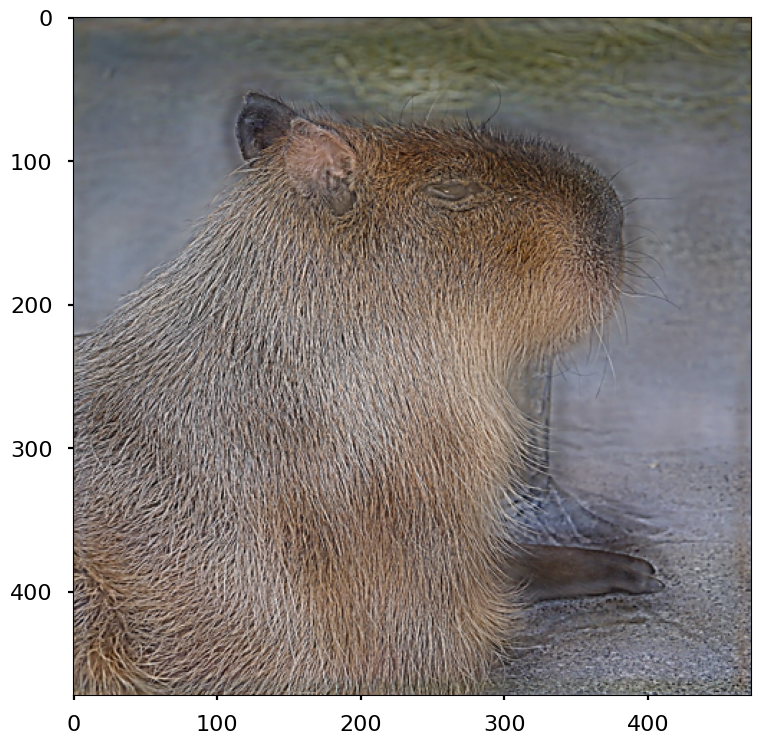

In [336]:
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\4059851189.py:22: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


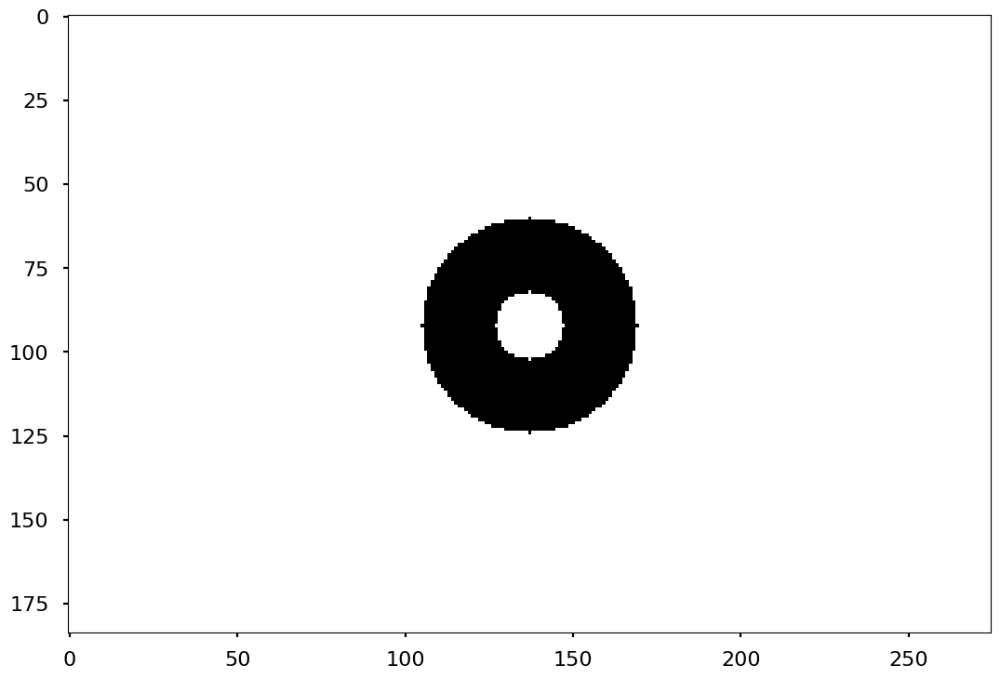

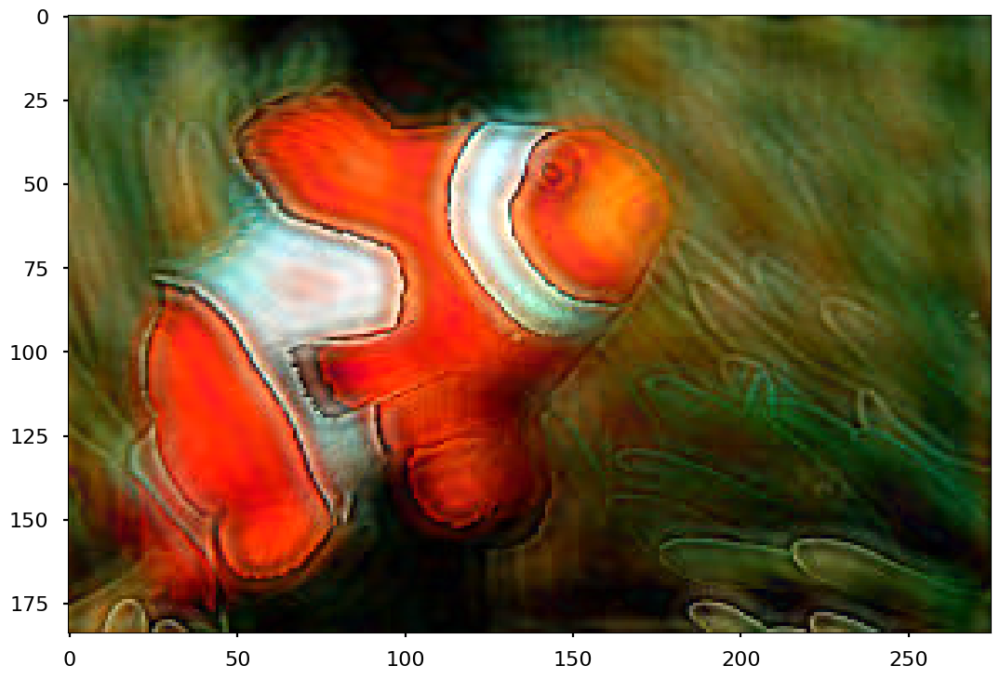

In [337]:
# create circle mask
radius = 32
mask = np.zeros_like(img2)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]


radius2 = 10
#mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx, cy), radius2, (0, 0, 0), -1)[0]
bitwise = cv2.bitwise_not(mask, mask)

f = np.fft.fft2(img2, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()

C:\Users\chinnawut\AppData\Local\Temp\ipykernel_4340\3224551365.py:22: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


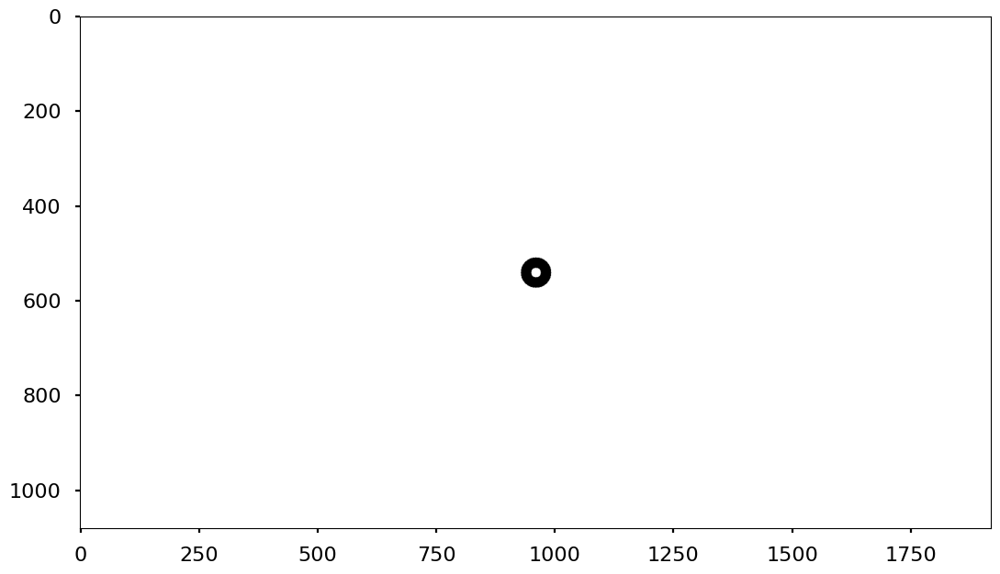

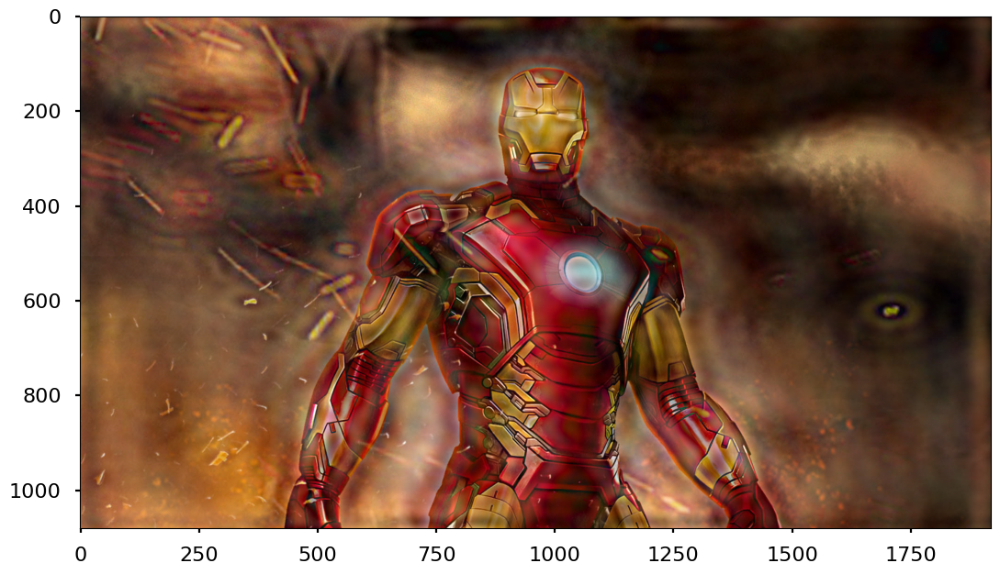

In [338]:
# create circle mask
radius = 32
mask = np.zeros_like(img3)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]


radius2 = 10
#mask = np.zeros_like(img_gray)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx, cy), radius2, (0, 0, 0), -1)[0]
bitwise = cv2.bitwise_not(mask, mask)

f = np.fft.fft2(img3, axes=(0,1))
fshift = np.fft.fftshift(f)
# apply mask to fshift
dft_shift_masked = np.multiply(fshift,mask) / 255

# generate spectrum from magnitude image (for viewing only)
magnitude_spectrum_dft_shift_masked = 20*np.log(np.abs(dft_shift_masked))

plt.set_cmap("gray")
plt.imshow(magnitude_spectrum_dft_shift_masked.clip(0,255))
plt.show()

back_ishift_masked = np.fft.ifftshift(dft_shift_masked)
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)

plt.set_cmap("gray")
plt.imshow(img_filtered)
plt.show()